In [3]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/just-another-image/house.jpg
/kaggle/input/neural-style-transfer/content3.jpeg
/kaggle/input/neural-style-transfer/content1.jpg
/kaggle/input/neural-style-transfer/content6.jpg
/kaggle/input/neural-style-transfer/style2.jpg
/kaggle/input/neural-style-transfer/style1.jpg
/kaggle/input/neural-style-transfer/style6.jpg
/kaggle/input/neural-style-transfer/content5.jpg
/kaggle/input/neural-style-transfer/style4.jpeg
/kaggle/input/neural-style-transfer/content7.jpg
/kaggle/input/neural-style-transfer/style5.jpg
/kaggle/input/neural-style-transfer/content4.jpg
/kaggle/input/neural-style-transfer/style7.jpg
/kaggle/input/neural-style-transfer/content2.jpg
/kaggle/input/neural-style-transfer/style3.jpg


# Dependencies 

In [4]:
import torch
import torch.nn.functional as F
import torch.nn as nn
from PIL import Image 
from torchvision import models
from torchvision import transforms
import matplotlib.pyplot as plt


# Global Variables 

In [5]:
size = 512


In [6]:
if torch.cuda.is_available():
    device = 'cuda'
    size = 512
else:
    device = 'cpu'
    size = 128
    

# Transforms 

In [7]:
class UnNormalize:
    def __init__(self, mean, std):
        self.mean = mean
        self.std = std

    def __call__(self, tensor):
        # Create a new tensor instead of modifying in place
        for t, m, s in zip(tensor, self.mean, self.std):
            t.mul_(s).add_(m)
        return tensor
    

# Image loader , unloader , viewer 

In [8]:
loader = transforms.Compose([
    transforms.Resize(size),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    transforms.Lambda(lambda x: x.mul(255)),
])
unloader = transforms.Compose([
    transforms.Lambda(lambda x: x.div(255)),
    UnNormalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    transforms.Lambda(lambda x: torch.clamp(x, 0, 1)),  
    transforms.ToPILImage()
])

def img_loader(img_name):
    image = Image.open(img_name)
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float)

def view(img_name):
    image = Image.open(img_name)
    plt.imshow(image)
    plt.show()

def unloader_view(tensor):
    img = tensor.cpu().clone()
    img = img.squeeze(0)
    img = unloader(img)
    plt.imshow(img)
    plt.pause(0.001)


# Content Loss 

In [9]:
def content_loss(input,target):
    target2 = target.detach()
    return F.mse_loss(input,target2)


# Gram Matrix and Style Loss 

In [10]:

def gram_matrix(input):
    a, b, c, d = input.size()
    features = input.view(a * b, c * d)
    G = torch.mm(features, features.t())
    return G.div(a * b * c * d)

def style_loss(input, target):
    i_gram = gram_matrix(input)
    t_gram = gram_matrix(target).detach()
    return F.mse_loss(i_gram, t_gram)

# Normalisation

In [11]:
weights = models.VGG19_Weights.IMAGENET1K_V1

model = models.vgg19(weights=weights).features.to(device).eval()

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:03<00:00, 175MB/s]  


In [12]:
model

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

In [13]:
 def forward(x, layer_indices,model):
        output = []
        for i, layer in enumerate(model):
            x = layer(x)
            if i in layer_indices:
                output.append(x)
        return output


In [14]:
def set_relu_inplace_false(model):
    for module in model.modules():
        if isinstance(module, nn.ReLU):
            module.inplace = False

# Apply the function to the model
set_relu_inplace_false(model)

In [15]:
content_layers = [22]
style_layers = [1, 6, 11, 20, 29]


In [16]:
con_image = '/kaggle/input/neural-style-transfer/content5.jpg'
con_img = img_loader(con_image)
gen_img = con_img.clone().requires_grad_(True)
sty_image = '/kaggle/input/neural-style-transfer/style6.jpg'
sty_img = img_loader(sty_image)


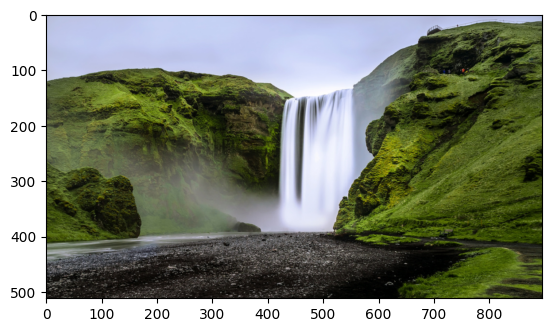

In [17]:
unloader_view(con_img)

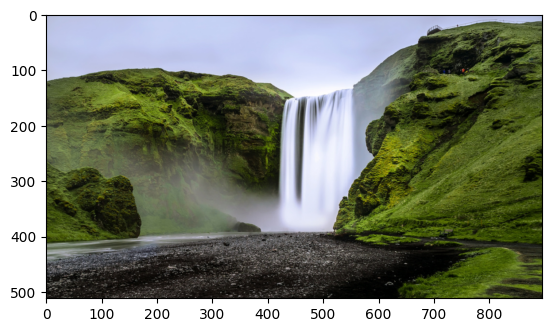

In [18]:
unloader_view(gen_img.clone().detach())

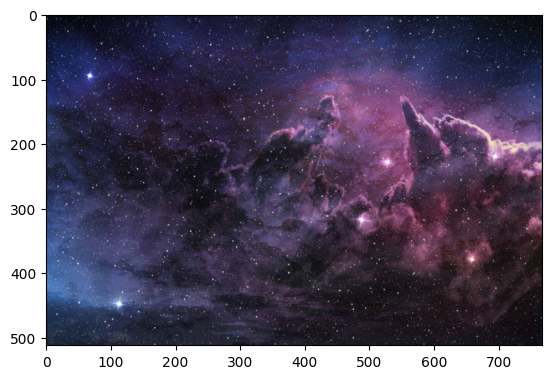

In [19]:
unloader_view(sty_img)

In [20]:
epochs = 1000


In [21]:
optimizer = torch.optim.Adam([gen_img],lr = 7)


50 / 1000, Loss : 23799330816.0


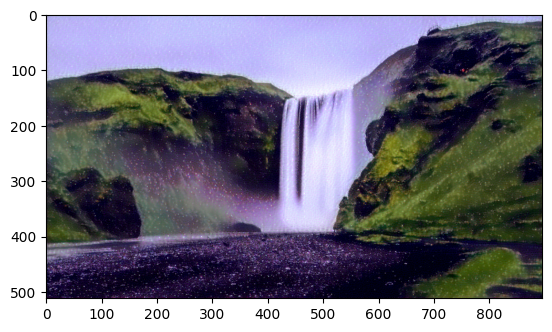

100 / 1000, Loss : 7824765440.0


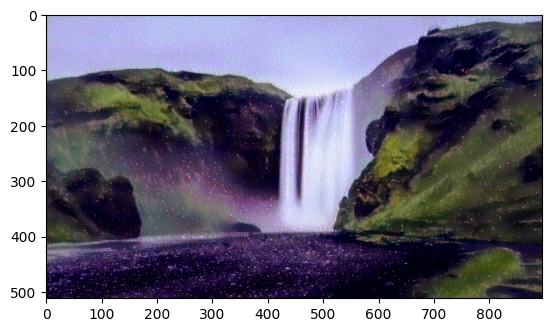

150 / 1000, Loss : 4511139840.0


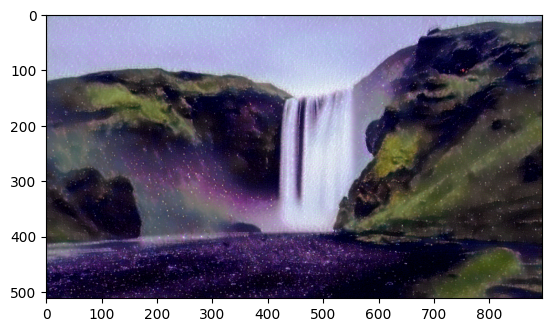

200 / 1000, Loss : 2929971456.0


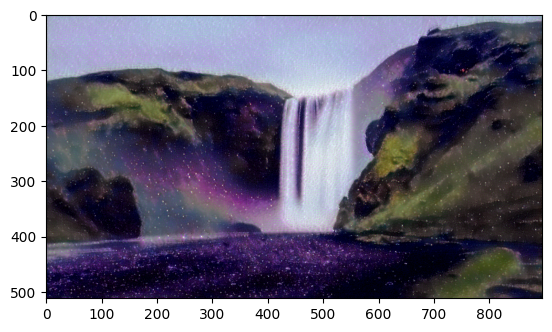

250 / 1000, Loss : 2030127360.0


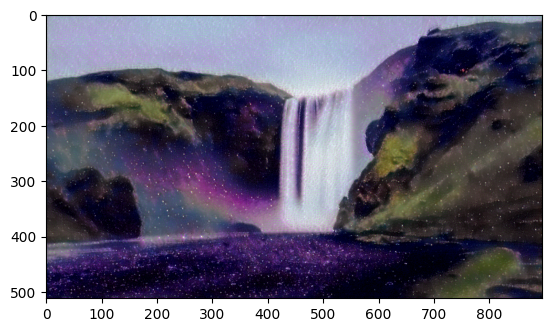

300 / 1000, Loss : 1479723136.0


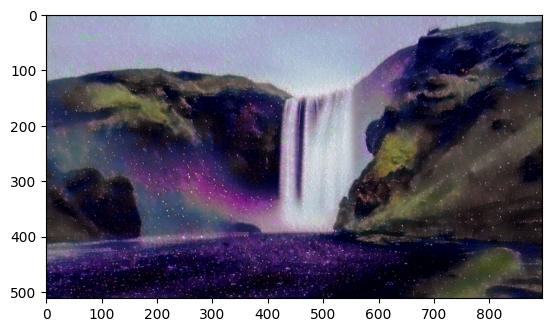

350 / 1000, Loss : 1123367296.0


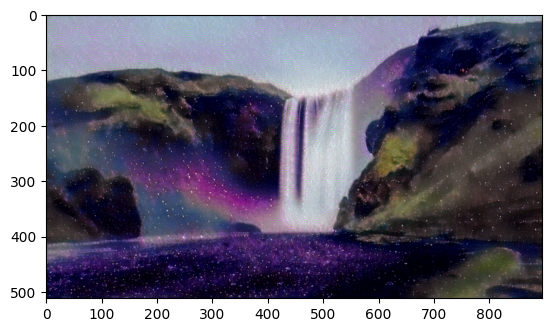

400 / 1000, Loss : 881414912.0


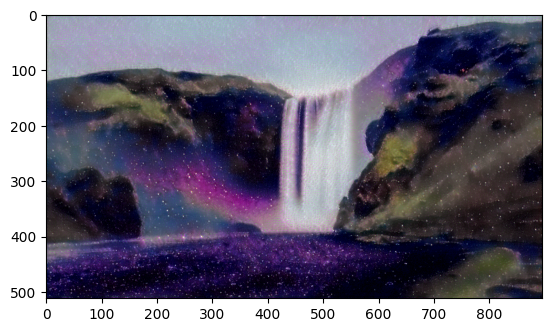

450 / 1000, Loss : 710070080.0


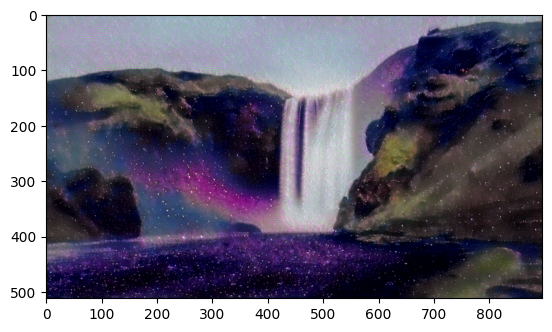

500 / 1000, Loss : 584423936.0


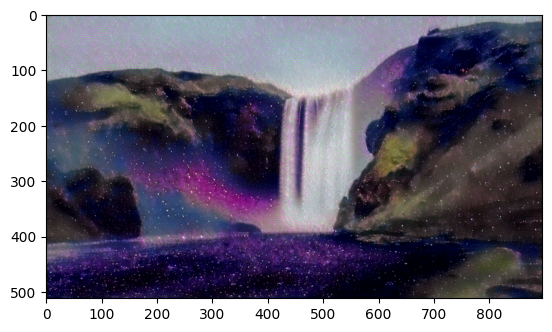

550 / 1000, Loss : 489692352.0


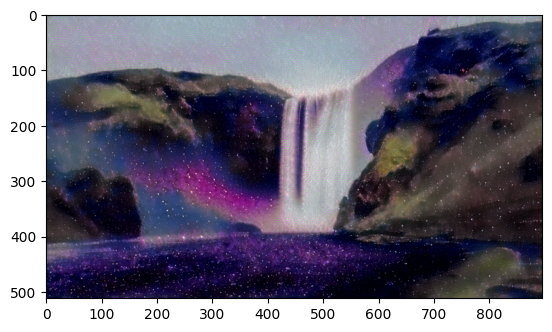

600 / 1000, Loss : 416952032.0


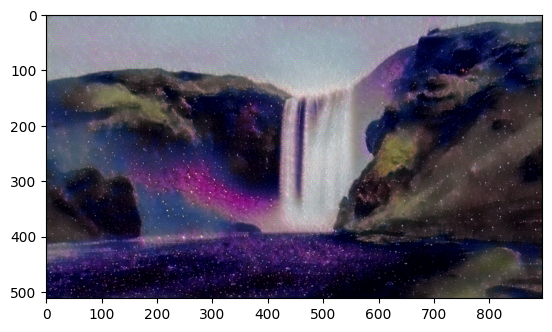

650 / 1000, Loss : 365354720.0


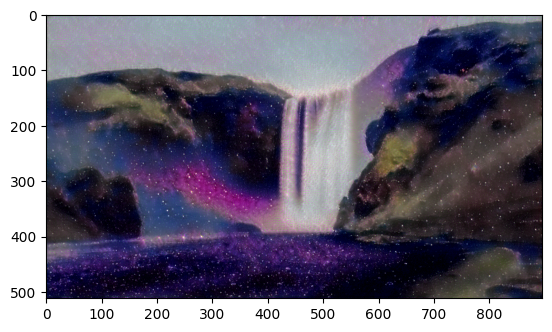

700 / 1000, Loss : 316752800.0


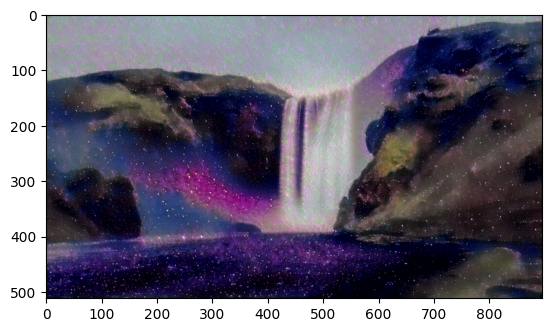

750 / 1000, Loss : 278232768.0


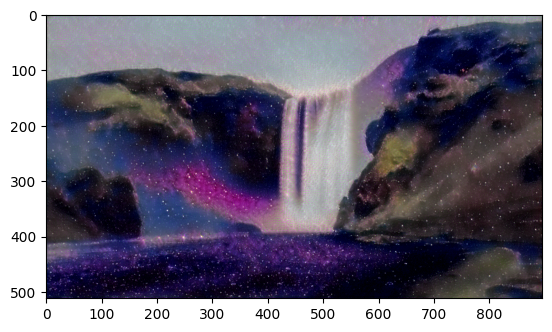

800 / 1000, Loss : 243956768.0


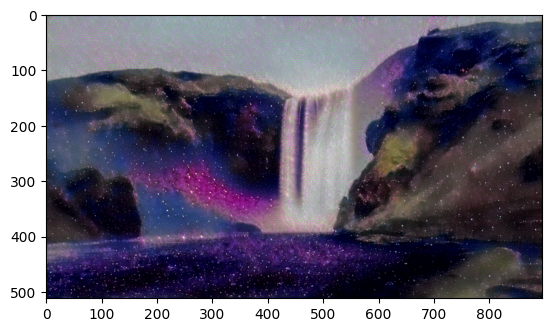

850 / 1000, Loss : 227631248.0


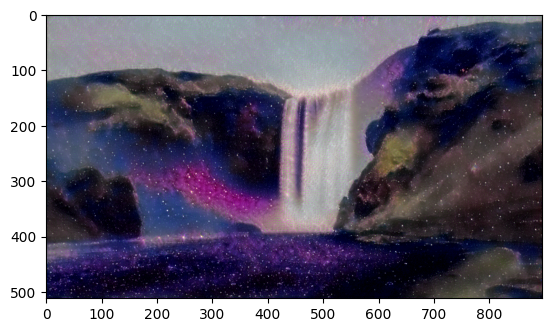

900 / 1000, Loss : 204129584.0


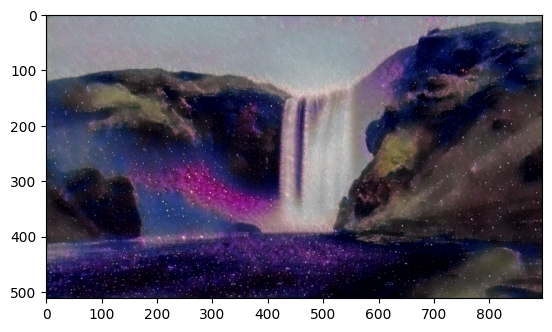

950 / 1000, Loss : 187818256.0


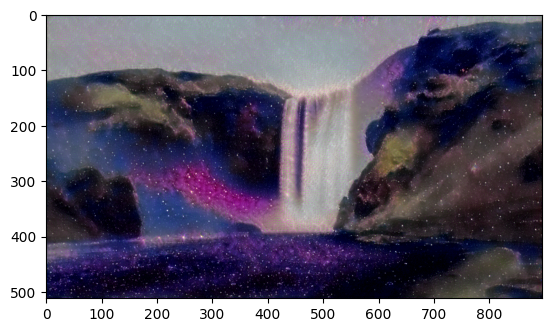

1000 / 1000, Loss : 169870656.0


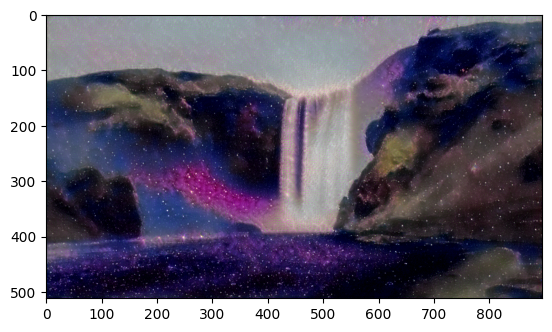

In [22]:
style_weight = 1e6

content_weight = 1

for epoch in range(epochs):
    optimizer.zero_grad()
    
    style_features = forward(sty_img, style_layers, model)
    content_features = forward(con_img, content_layers, model)
    gen_style_features = forward(gen_img, style_layers, model)
    gen_content_features = forward(gen_img, content_layers, model)
    
    style_losses = [style_loss(gs, s) for gs, s in zip(gen_style_features, style_features)]
    content_losses = [content_loss(gc, c) for gc, c in zip(gen_content_features, content_features)]
    
    total_loss = style_weight * sum(style_losses) + content_weight * sum(content_losses)
    total_loss.backward()
    
    optimizer.step()
    
    if (epoch + 1) % 50 == 0:
        print(f"{epoch + 1} / {epochs}, Loss : {total_loss.item()}")
        unloader_view(gen_img.clone().detach())


In [23]:
final = unloader(gen_img.clone().detach().squeeze(0))

In [24]:
final.save('result.png')

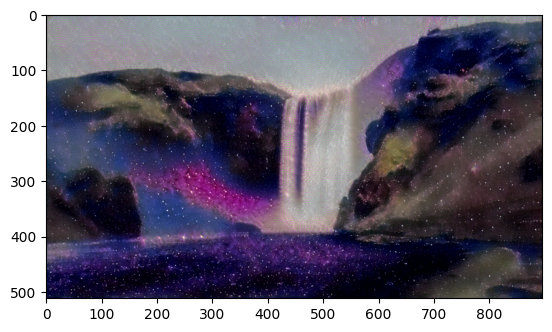

In [33]:
plt.imshow(final)

# Losses function

In [ ]:
def losses(model,content_img,style_img,gen_img,content_layers,style_layer):
    

# Run function 